# Non-Maximum Supression


In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
from plantclef.spark import get_spark

spark = get_spark(cores=4)
display(spark)

Setting default log level to "WARN".
To adjust logging level use sc.setLogLevel(newLevel). For SparkR, use setLogLevel(newLevel).
25/05/03 15:44:35 WARN NativeCodeLoader: Unable to load native-hadoop library for your platform... using builtin-java classes where applicable
25/05/03 15:44:35 WARN SparkConf: Note that spark.local.dir will be overridden by the value set by the cluster manager (via SPARK_LOCAL_DIRS in mesos/standalone/kubernetes and LOCAL_DIRS in YARN).
25/05/03 15:44:36 WARN Utils: Service 'SparkUI' could not bind on port 4040. Attempting port 4041.


In [3]:
import os
from pathlib import Path

# Get list of stored filed in cloud bucket
root = Path(os.path.expanduser("~"))
! date

Sat May  3 03:44:38 PM EDT 2025


### test dataset

In [4]:
# Path and dataset names
data_path = f"{root}/p-dsgt_clef2025-0/shared/plantclef/data"
test_path = f"{data_path}/parquet/test_2025"
test_df = spark.read.parquet(test_path)
test_df.printSchema()
test_df.show(n=5)

root
 |-- image_name: string (nullable = true)
 |-- path: string (nullable = true)
 |-- data: binary (nullable = true)



+--------------------+--------------------+--------------------+
|          image_name|                path|                data|
+--------------------+--------------------+--------------------+
|CBN-Pla-B3-201907...|/test/data/PlantC...|[FF D8 FF E0 00 1...|
|CBN-PdlC-E5-20180...|/test/data/PlantC...|[FF D8 FF E0 00 1...|
|CBN-PdlC-B1-20140...|/test/data/PlantC...|[FF D8 FF E0 00 1...|
|CBN-Pla-D4-201507...|/test/data/PlantC...|[FF D8 FF E0 00 1...|
|CBN-PdlC-F3-20190...|/test/data/PlantC...|[FF D8 FF E0 00 1...|
+--------------------+--------------------+--------------------+
only showing top 5 rows



In [5]:
# get image
# target_image_name = "CBN-can-A1-20230705.jpg"
target_image_name = "CBN-PdlC-B6-20150810.jpg"
image_row = test_df.filter(test_df.image_name == target_image_name).collect()

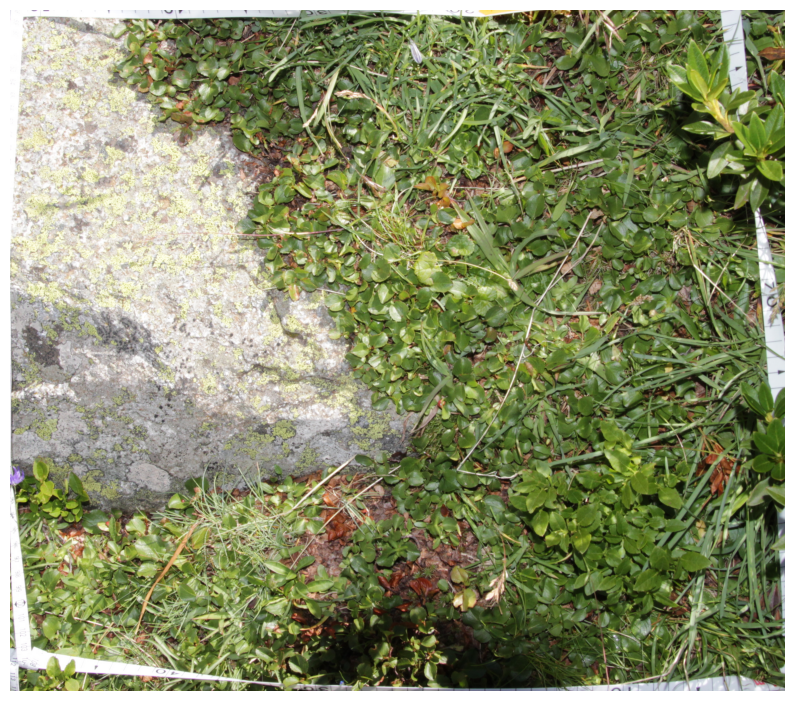

In [6]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from plantclef.serde import deserialize_image


# extract image
img_bytes = image_row[0]["data"]
np_arr = np.frombuffer(img_bytes, np.uint8)
img_cv2 = cv2.imdecode(np_arr, cv2.IMREAD_COLOR)
img = deserialize_image(img_bytes)  # Pillow image

# show or inspect the image
img_rgb = cv2.cvtColor(img_cv2, cv2.COLOR_BGR2RGB)
# plot Pillow image
plt.figure(figsize=(10, 10))
plt.imshow(img)  # img_rgb
plt.axis("off")
plt.show()

In [7]:
import torch
from transformers import (
    SamModel,
    SamProcessor,
    AutoProcessor,
    AutoModelForZeroShotObjectDetection,
)


checkpoint_path_sam = "facebook/sam-vit-huge"
checkpoint_path_groundingdino = "IDEA-Research/grounding-dino-base"
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")
# https://huggingface.co/docs/transformers/main/en/model_doc/sam
sam_model = SamModel.from_pretrained(checkpoint_path_sam).to(device)
sam_processor = SamProcessor.from_pretrained(checkpoint_path_sam)
# https://huggingface.co/docs/transformers/main/en/model_doc/grounding-dino
groundingdino_model = AutoModelForZeroShotObjectDetection.from_pretrained(
    checkpoint_path_groundingdino
).to(device)
groundingdino_processor = AutoProcessor.from_pretrained(checkpoint_path_groundingdino)

Using device: cuda


In [8]:
# GroundingDINO params
IMAGE_NAME = "CBN-can-A1-20230705.jpg"
ALL_CLASSES = [
    "leaf",
    "flower",
    "plant",
    "sand",
    "wood",
    "stone",
    "tape",
    "tree",
    "rock",
    "vegetation",
]
CLASSES = ["single leaf", "single flower", "entire plant", "rocks"]
BOX_THRESHOLD = 0.15
TEXT_THRESHOLD = 0.1


def detect(image, classes: list[str]) -> dict:
    # predict with groundingdino
    inputs = groundingdino_processor(
        images=image,
        text=classes,
        return_tensors="pt",
    ).to(device)

    with torch.no_grad():
        outputs = groundingdino_model(**inputs)

    # dictionary with boxes, scores, text_labels
    return groundingdino_processor.post_process_grounded_object_detection(
        outputs,
        threshold=BOX_THRESHOLD,
        text_threshold=TEXT_THRESHOLD,
        target_sizes=[(image.height, image.width)],
    )[0]  # return the dictionary inside the list


detections = detect(image=img, classes=CLASSES)
detections.keys()

dict_keys(['scores', 'boxes', 'text_labels', 'labels'])

In [9]:
detections["text_labels"]

['entire plant',
 'rocks',
 'single leaf single flower',
 'single leaf single flower',
 'entire plant',
 'single leaf',
 'single leaf',
 'single leaf',
 'single leaf single flower entire plant',
 'single leaf',
 'entire plant',
 'single leaf',
 'single leaf',
 'single leaf',
 'single leaf',
 'single flower',
 'single leaf']

In [10]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches


def plot_detections(image, detections):
    # assign colors to labels
    unique_labels = list(set(detections["text_labels"]))
    cmap = plt.get_cmap("tab10", len(unique_labels))
    label_to_color = {label: cmap(i) for i, label in enumerate(unique_labels)}

    # Create a matplotlib figure
    fig, ax = plt.subplots(figsize=(10, 10))
    ax.imshow(image)  # Pillow image

    # Loop through detections and draw boxes with corresponding label colors
    for box, label, score in zip(
        detections["boxes"], detections["text_labels"], detections["scores"]
    ):
        x_min, y_min, x_max, y_max = box.tolist()
        color = label_to_color[label]

        # Create a rectangle patch
        rect = patches.Rectangle(
            (x_min, y_min),
            x_max - x_min,
            y_max - y_min,
            linewidth=2,
            edgecolor=color,
            facecolor="none",
        )
        ax.add_patch(rect)

        # Add label text
        ax.text(
            x_min,
            y_min - 5,
            f"{label} {score:.2f}",
            fontsize=12,
            color="white",
            bbox=dict(facecolor=color, edgecolor="none", pad=2.0),
        )

    plt.axis("off")
    plt.tight_layout()
    plt.show()

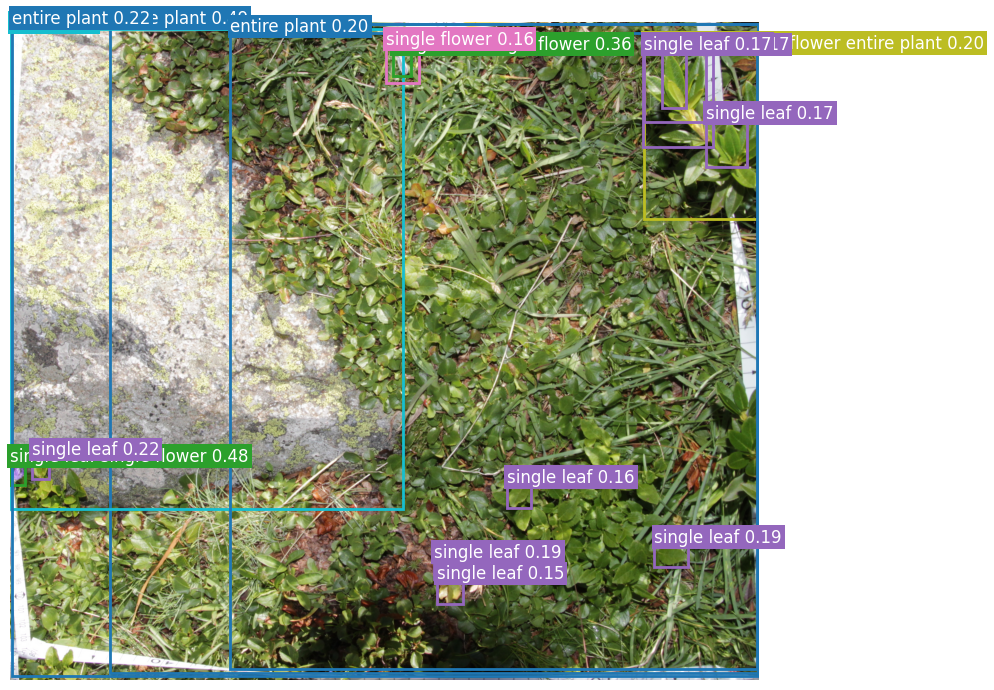

In [11]:
plot_detections(image=img, detections=detections)

### training data plant organs
```
train_df.groupBy("organ").count().show()

+------+------+
| organ| count|
+------+------+
|flower|389251|
|  scan|  8204|
| fruit|165855|
| habit|355732|
|  leaf|340852|
|branch| 59632|
|  bark| 88507|
+------+------+
```

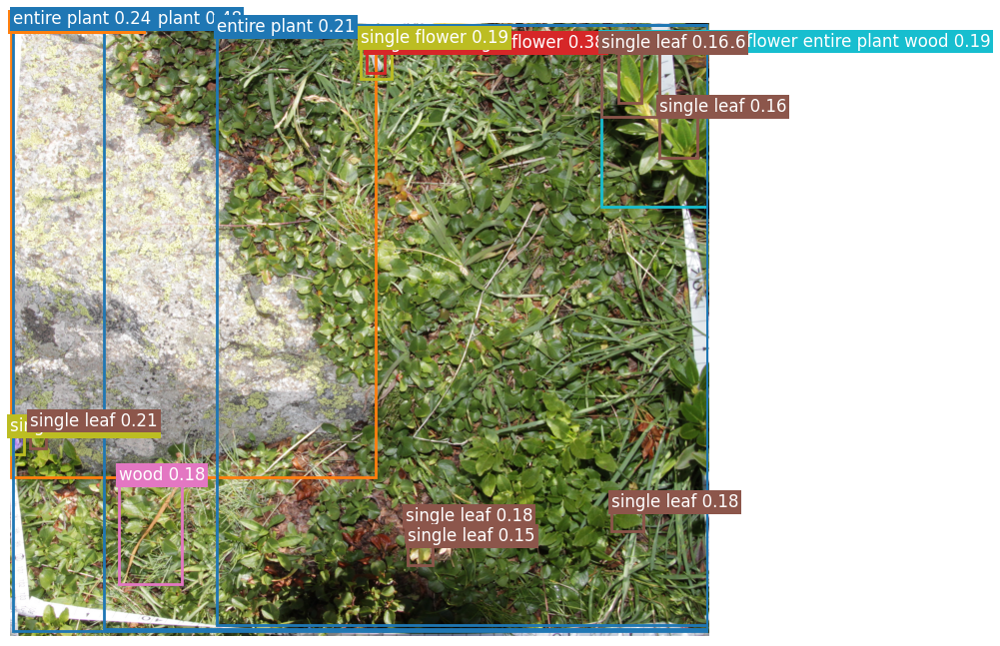

In [12]:
# new classes based on plant organ
CLASSES = [
    "single leaf",
    "single flower",
    # "single fruit",
    "entire plant",
    "single rock",
    "wood",
]
BOX_THRESHOLD = 0.15
TEXT_THRESHOLD = 0.1

detections = detect(image=img, classes=CLASSES)
plot_detections(image=img, detections=detections)

In [13]:
import cv2
import numpy as np


def non_max_suppression(
    detections, nms_threshold: float = 0.25, box_threshold: float = 0.15
):
    # convert tensors to lists
    boxes = detections["boxes"].tolist()
    scores = detections["scores"].tolist()
    labels = detections["text_labels"]

    # convert boxes to [x, y, width, height] format
    boxes_coco = [
        [int(x_min), int(y_min), int(x_max - x_min), int(y_max - y_min)]
        for x_min, y_min, x_max, y_max in boxes
    ]

    # apply NMS
    indices = cv2.dnn.NMSBoxes(
        bboxes=boxes_coco,
        scores=scores,
        score_threshold=box_threshold,
        nms_threshold=nms_threshold,
    )

    # flatten indices and filter detections
    if len(indices) > 0:
        kept_indices = indices.flatten()
    else:
        kept_indices = []

    # filter detections
    filtered_boxes = np.array([boxes[i] for i in kept_indices])
    filtered_scores = np.array([scores[i] for i in kept_indices])
    filtered_labels = np.array([labels[i] for i in kept_indices])

    # prepare filtered detections dictionary
    filtered_detections = {
        "boxes": filtered_boxes,
        "scores": filtered_scores,
        "text_labels": filtered_labels,
    }

    return filtered_detections

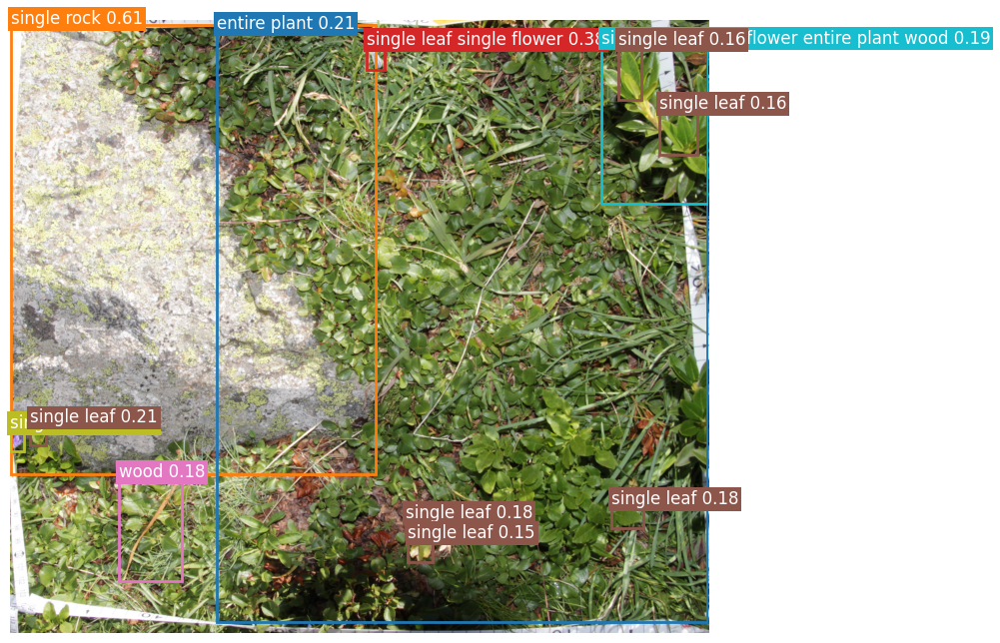

In [14]:
filtered_detections = non_max_suppression(detections=detections)
plot_detections(image=img, detections=filtered_detections)

In [15]:
(
    len(filtered_detections["boxes"]),
    len(filtered_detections["scores"]),
    len(filtered_detections["text_labels"]),
)

(12, 12, 12)

In [16]:
import matplotlib.pyplot as plt


def plot_detections_side_by_side(image, detections_original, detections_nms):
    def draw_detections(ax, image, detections, title):
        # assign colors to labels
        unique_labels = list(set(detections["text_labels"]))
        cmap = plt.get_cmap("tab10", len(unique_labels))
        label_to_color = {label: cmap(i) for i, label in enumerate(unique_labels)}

        ax.imshow(image)
        ax.set_title(title, weight="bold", fontsize=20)
        ax.axis("off")

        for box, label, score in zip(
            detections["boxes"], detections["text_labels"], detections["scores"]
        ):
            # If box is a list, unpack directly; if tensor, use .tolist()
            if hasattr(box, "tolist"):
                x_min, y_min, x_max, y_max = box.tolist()
            else:
                x_min, y_min, x_max, y_max = box

            color = label_to_color[label]

            rect = patches.Rectangle(
                (x_min, y_min),
                x_max - x_min,
                y_max - y_min,
                linewidth=3,
                edgecolor=color,
                facecolor="none",
            )
            ax.add_patch(rect)

            ax.text(
                x_min,
                y_min - 5,
                f"{label} {score:.2f}",
                fontsize=8,
                color="white",
                bbox=dict(facecolor=color, edgecolor="none", pad=1.0),
            )

    # Create side-by-side plots
    fig, axes = plt.subplots(1, 2, figsize=(20, 10))

    draw_detections(axes[0], image, detections_original, "Original Detections")
    draw_detections(axes[1], image, detections_nms, "Detections After NMS")

    plt.tight_layout()
    plt.show()

number original boxes: 15
number NMS boxes: 7


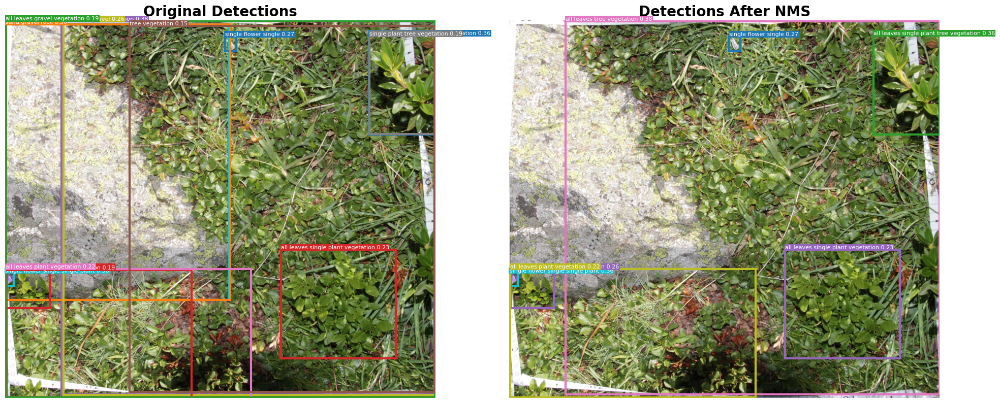

In [31]:
CLASSES = [
    "all leaves",
    "single flower",
    "single fruit",
    "sand",
    "gravel",
    "wood",
    "tape",
    "single plant",
    "tree",
    "rock",
    "vegetation",
]
detections = detect(image=img, classes=CLASSES)
print(f"number original boxes: {len(detections['boxes'])}")
# apply NMS
filtered_detections = non_max_suppression(detections=detections)
print(f"number NMS boxes: {len(filtered_detections['boxes'])}")
plot_detections_side_by_side(img, detections, filtered_detections)

In [34]:
from collections import defaultdict


def get_positive_detections(filtered_detections):
    positive_classes = [
        "leaves",
        "flower",
        "fruit",
        "plant",
        "vegetation",
    ]
    # dictionary of lists to store positive detections
    positive_detections = defaultdict(list)

    for i in range(len(filtered_detections["text_labels"])):
        label = filtered_detections["text_labels"][i]
        if any(positive_class in label for positive_class in positive_classes):
            positive_detections["text_labels"].append(label)
            positive_detections["boxes"].append(filtered_detections["boxes"][i])
            positive_detections["scores"].append(filtered_detections["scores"][i])

    positive_detections["text_labels"] = np.array(positive_detections["text_labels"])
    positive_detections["boxes"] = np.array(positive_detections["boxes"])
    positive_detections["scores"] = np.array(positive_detections["scores"])

    return positive_detections

In [35]:
positive_detections = get_positive_detections(filtered_detections)
print(f"number positive detections: {len(positive_detections['boxes'])}")
display(filtered_detections["text_labels"])
display(positive_detections["text_labels"])

number positive detections: 7


array(['all leaves tree vegetation', 'single flower single single plant',
       'all leaves single plant tree vegetation', 'single flower single',
       'all leaves single plant vegetation',
       'all leaves single plant vegetation',
       'all leaves plant vegetation'], dtype='<U39')

array(['all leaves tree vegetation', 'single flower single single plant',
       'all leaves single plant tree vegetation', 'single flower single',
       'all leaves single plant vegetation',
       'all leaves single plant vegetation',
       'all leaves plant vegetation'], dtype='<U39')

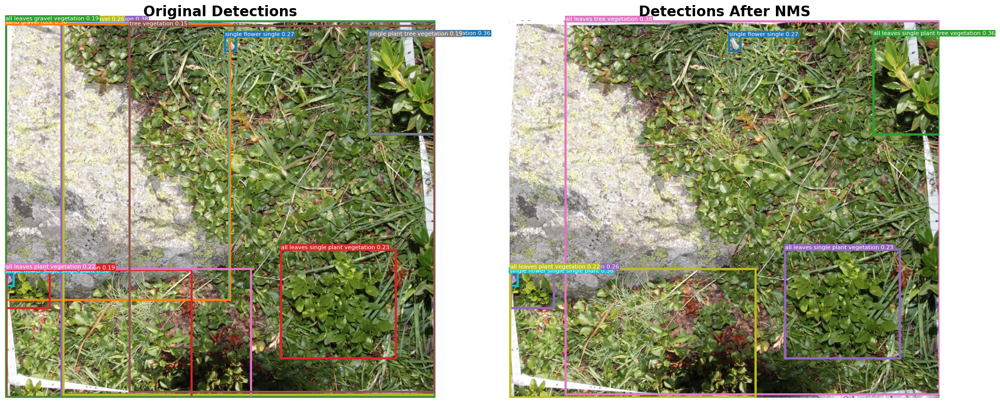

In [20]:
plot_detections_side_by_side(img, detections, positive_detections)

In [21]:
from PIL import Image
from plantclef.serde import serialize_image


def extract_and_serialize_bounding_boxes(
    image: Image.Image,
    positive_detections: dict,
):
    """
    Given an image and detections, crops each bounding box and serializes it to bytes.

    Args:
        image (PIL.Image.Image): The full input image (Pillow format).
        detections (dict): Dictionary with 'boxes' key containing bounding boxes.

    Returns:
        List[bytes]: List of serialized cropped bounding boxes.
    """
    serialized_boxes = []
    detections = {}

    for box in positive_detections["boxes"]:
        # unpack the bounding box coordinates
        x_min, y_min, x_max, y_max = map(int, box.tolist())
        # crop the bounding box from the image
        cropped = image.crop((x_min, y_min, x_max, y_max))
        # serialize the cropped image
        serialized_box = serialize_image(cropped)
        serialized_boxes.append(serialized_box)

    detections["extracted_bbox"] = serialized_boxes
    detections["boxes"] = positive_detections["boxes"]
    detections["scores"] = positive_detections["scores"]
    detections["text_labels"] = positive_detections["text_labels"]

    return detections

In [22]:
final_detections = extract_and_serialize_bounding_boxes(
    img,
    positive_detections,
)

In [23]:
(
    len(final_detections["extracted_bbox"]),
    len(final_detections["boxes"]),
    len(final_detections["scores"]),
    len(final_detections["text_labels"]),
)

(17, 17, 17, 17)

In [24]:
(
    type(final_detections["extracted_bbox"][0]),
    type(final_detections["boxes"][0]),
    type(final_detections["scores"][0]),
    type(final_detections["text_labels"][0]),
)

(bytes, numpy.ndarray, numpy.float64, numpy.str_)